# The Coin Whisperer Project
*USYD FinTech Bootcamp Jul-2023 Group Project 2 - Group 3*

# 1. Setup and Imports

In [1]:
# Libraries and Dependencies
## Base
import pandas as pd
import numpy as np
import time
import os
from pathlib import Path
import hvplot.pandas
import holoviews as hv
import yfinance as yf
from dotenv import load_dotenv
from PIL import Image, ImageDraw, ImageFont

# Machine Learning
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
%matplotlib inline
from pandas.tseries.offsets import DateOffset
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import balanced_accuracy_score
from imblearn.metrics import classification_report_imbalanced
from prophet import Prophet
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from arch import arch_model

## Additional Work
import fear_and_greed
import alpaca_trade_api as tradeapi

# Installs needed for the code
## !pip install yfinance
## !pip install fear_and_greed
## !pip install arch
#pip install selenium

--------------------

# 2. Inputs and Initial Data

In [2]:
load_dotenv()

True

In [3]:
# Set the start and end dates
start_date = "2019-04-01"
end_date = "2023-07-12"

# Retrieve the Ethereum data
BTC = yf.Ticker("BTC-USD")
BTC_data = BTC.history(start = start_date, end = end_date)

# Display the DataFrame with hourly data for Ethereum
df_stock = pd.DataFrame(BTC_data)
df_stock.index = pd.to_datetime(df_stock.index, infer_datetime_format=True)
df_stock.index.name = 'date'

In [4]:
# Create a copy of the dataframe
df_data = df_stock.copy()

In [5]:
# create a dataframe with the Close column only
df_close = df_data['Close']
df_profolio = pd.DataFrame(df_close)
df_profolio.head()

,Close
date,
2019-04-01 00:00:00+00:00,4158.183105
2019-04-02 00:00:00+00:00,4879.877930
2019-04-03 00:00:00+00:00,4973.021973
2019-04-04 00:00:00+00:00,4922.798828
2019-04-05 00:00:00+00:00,5036.681152


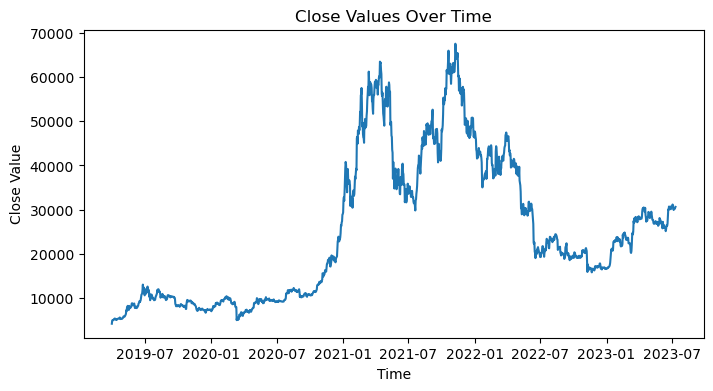

In [6]:
# Create the plot
plt.figure(figsize=(8, 4)) # you can adjust the size as needed
plt.plot(df_profolio["Close"])

# Add title and labels if needed
plt.title("Close Values Over Time")
plt.xlabel("Time")
plt.ylabel("Close Value")

# Save the plot
plt.savefig('./Images/stock.png')

----------------------------------------------

# 3. Data Processing

In [7]:
# Create a copy of the df_stock dataframe to calculate the actual_returns columns
df_stock_copy = df_stock.copy()

In [8]:
df_stock_copy["actual_returns"] = df_stock_copy["Close"].pct_change()
df_stock_copy.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2019-04-01 00:00:00+00:00,4105.362305,4164.953125,4096.901367,4158.183105,10157794171,0.0,0.0,NaN
2019-04-02 00:00:00+00:00,4156.919434,4905.954590,4155.316895,4879.877930,21315047816,0.0,0.0,0.173560
2019-04-03 00:00:00+00:00,4879.958008,5307.003418,4876.621094,4973.021973,22899891582,0.0,0.0,0.019087
2019-04-04 00:00:00+00:00,4971.307617,5063.159668,4836.793945,4922.798828,18251810240,0.0,0.0,-0.010099
2019-04-05 00:00:00+00:00,4922.806152,5053.509766,4919.491699,5036.681152,16837325387,0.0,0.0,0.023134


In [9]:
# Clean and review the dataframe
df_ml = df_stock_copy.dropna()
display(df_ml.head())
display(df_ml.tail())

,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2019-04-02 00:00:00+00:00,4156.919434,4905.954590,4155.316895,4879.877930,21315047816,0.0,0.0,0.173560
2019-04-03 00:00:00+00:00,4879.958008,5307.003418,4876.621094,4973.021973,22899891582,0.0,0.0,0.019087
2019-04-04 00:00:00+00:00,4971.307617,5063.159668,4836.793945,4922.798828,18251810240,0.0,0.0,-0.010099
2019-04-05 00:00:00+00:00,4922.806152,5053.509766,4919.491699,5036.681152,16837325387,0.0,0.0,0.023134
2019-04-06 00:00:00+00:00,5036.792969,5205.821777,4992.222168,5059.817383,16929795194,0.0,0.0,0.004594


,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2023-07-07 00:00:00+00:00,29907.998047,30434.644531,29777.285156,30342.265625,13384770155,0.0,0.0,0.014475
2023-07-08 00:00:00+00:00,30346.921875,30374.437500,30080.160156,30292.541016,7509378699,0.0,0.0,-0.001639
2023-07-09 00:00:00+00:00,30291.611328,30427.589844,30085.591797,30171.234375,7903327692,0.0,0.0,-0.004005
2023-07-10 00:00:00+00:00,30172.423828,31026.083984,29985.394531,30414.470703,14828209155,0.0,0.0,0.008062
2023-07-11 00:00:00+00:00,30417.632812,30788.314453,30358.097656,30620.951172,12151839152,0.0,0.0,0.006789


In [10]:
# Prepare dataframes for machine learning models later
X_df = df_ml[['Open','High','Low','Close','Volume','actual_returns']].reset_index().drop(columns=['date'])
X_nn = X_df[['Open','High','Low','Close','Volume']]

# Create a new column in the `trading_df` called "signal" setting its value to zero.
X_df["signal"] = 0.0

# Create the signal to buy
X_df.loc[(X_df["actual_returns"] >= 0), "signal"] = 1

# Create the signal to sell
X_df.loc[(X_df["actual_returns"] < 0), "signal"] = 0

-----------------------

# 4. Machine Learning Analysis

### Scikit-learn: Logistic Regression

In [11]:
# Establish the dataframe columns and perform train_test_split
X_lr = X_nn[['Open','High','Low','Close','Volume']]
y_lr = X_df['signal']
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_lr, y_lr, random_state=42)

In [12]:
y_lr.value_counts()

1.0    800
0.0    762
Name: signal, dtype: int64

In [13]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
lr_model = LogisticRegression(random_state=1)

# Fit the model using training data
lr_model.fit(X_train_lr, y_train_lr)

LogisticRegression(random_state=1)

In [14]:
# Make a prediction using the testing data
lr_predictions = lr_model.predict(X_test_lr)

In [15]:
# Display the accuracy score for the test dataset.
accuracy_score(y_test_lr, lr_predictions)

0.5140664961636828

In [16]:
# Gen# Create and save the confustion matrix for the training data
training_matrix = confusion_matrix(y_test_lr, lr_predictions)
training_matrix

array([[  0, 190],
       [  0, 201]], dtype=int64)

In [20]:
 # Create and save the training classifiction report
report_lr = classification_report_imbalanced(y_test_lr, lr_predictions)
print(report_lr)

                   pre       rec       spe        f1       geo       iba       sup

        0.0       0.00      0.00      1.00      0.00      0.00      0.00       190
        1.0       0.51      1.00      0.00      0.68      0.00      0.00       201

avg / total       0.26      0.51      0.49      0.35      0.00      0.00       391



C:\Users\boris\anaconda3\envs\dev\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [28]:
#use hourly data to increase dataset
df_stock_lr = BTC_data.resample('H').ffill()
df_stock_lr["actual_returns"] = df_stock_lr["Close"].pct_change()
df_stock_lr.dropna(inplace=True)

# Prepare dataframes for machine learning models later
X_df_lr = df_stock_lr[['Open','High','Low','Close','Volume','actual_returns']].reset_index().drop(columns=['date'])
X_nn_lr = X_df_lr[['Open','High','Low','Close','Volume']]

# Create a new column in the `trading_df` called "signal" setting its value to zero.
X_df_lr["signal"] = 0.0

# Create the signal to buy
X_df_lr.loc[(X_df_lr["actual_returns"] >= 0), "signal"] = 1

# Create the signal to sell
X_df_lr.loc[(X_df_lr["actual_returns"] < 0), "signal"] = 0

# Establish the dataframe columns and perform train_test_split
X_lr_new = X_nn_lr[['Open','High','Low','Close','Volume']]
y_lr_new = X_df_lr['signal']
X_train_lr_new, X_test_lr_new, y_train_lr_new, y_test_lr_new = train_test_split(X_lr_new, y_lr_new, random_state=42)

In [29]:
y_lr_new.value_counts()

1.0    36726
0.0      762
Name: signal, dtype: int64

In [30]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
lr_model_new = LogisticRegression(random_state=1)

# Fit the model using training data
lr_model_new.fit(X_train_lr_new, y_train_lr_new)

# Make a prediction using the testing data
lr_predictions_new = lr_model_new.predict(X_test_lr_new)

In [31]:
# Display the accuracy score for the test dataset.
accuracy_score(y_test_lr_new, lr_predictions_new)

0.9802603499786599

In [34]:
# Create and save the training classifiction report
report_lr_new = classification_report_imbalanced(y_test_lr_new, lr_predictions_new)
print(report_lr_new)

                   pre       rec       spe        f1       geo       iba       sup

        0.0       0.00      0.00      1.00      0.00      0.00      0.00       185
        1.0       0.98      1.00      0.00      0.99      0.00      0.00      9187

avg / total       0.96      0.98      0.02      0.97      0.00      0.00      9372



C:\Users\boris\anaconda3\envs\dev\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [35]:
# Resample dataset
# Import the RandomOverSampler module form imbalanced-learn
from imblearn.over_sampling import RandomOverSampler

# Instantiate the random oversampler model
# # Assign a random_state parameter of 1 to the model
ros_model = RandomOverSampler(random_state=1)

# Fit the original training data to the random_oversampler model
X_resampled, y_resampled = ros_model.fit_resample(X_train_lr_new, y_train_lr_new)

 # Count the distinct values of the resampled labels data
y_resampled.value_counts()

1.0    27539
0.0    27539
Name: signal, dtype: int64

In [41]:
 # Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
lro_model = LogisticRegression(random_state=1)

# Fit the model using the resampled training data
lro_model.fit(X_resampled, y_resampled)

# Make a prediction using the testing data
yo_pred = lro_model.predict(X_test_lr)

In [43]:
# Print the balanced_accuracy score of the model 
accuracy_score(y_test_lr, yo_pred)

0.4859335038363171

In [45]:
 # Generate a confusion matrix for the model
confusion_matrix(y_test_lr, yo_pred)

array([[190,   0],
       [201,   0]], dtype=int64)

In [140]:
# Print the classification report for the model
report_resample = classification_report_imbalanced(y_test_lr, yo_pred)
print(report_resample)

                   pre       rec       spe        f1       geo       iba       sup

        0.0       0.49      1.00      0.00      0.65      0.00      0.00       190
        1.0       0.00      0.00      1.00      0.00      0.00      0.00       201

avg / total       0.24      0.49      0.51      0.32      0.00      0.00       391



C:\Users\boris\anaconda3\envs\dev\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


-------------------

### Scikit-learn: Linear Regression

In [48]:
# Create the X set by using the `reshape` function to format the ads data as a single column array.
X_linear = df_ml[["Open", "High", "Low", "Close", "Volume"]].values

In [49]:
# Create an array for the dependent variable y with the sales data
y_linear = df_ml["actual_returns"]

In [50]:
# Create a model with scikit-learn
model_linear = LinearRegression()
# Fit the data into the model
model_linear.fit(X_linear, y_linear)

LinearRegression()

In [51]:
 # Display the slope
print(f"Model's slope: {model_linear.coef_}")

Model's slope: [-2.84587563e-05  2.14588127e-06 -1.16488219e-06  2.73388430e-05
  2.31933028e-14]


In [52]:
 # Display the y-intercept
print(f"Model's y-intercept: {model_linear.intercept_}")

Model's y-intercept: 0.002268766263181653


In [53]:
 # Display the model's best fit line formula
print(f"Model's formula: y = {model_linear.intercept_} + {model_linear.coef_[0]}X")

Model's formula: y = 0.002268766263181653 + -2.84587563086021e-05X


In [54]:
 # Make predictions using the X set
predicted_linear = model_linear.predict(X_linear)

In [55]:
 # Create a copy of the original data
df_linear = df_ml.copy()

# Add a column with the predicted sales values
df_linear["returns_predicted"] = predicted_linear

# Display sample data
df_linear.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns,returns_predicted
date,,,,,,,,,
2019-04-02 00:00:00+00:00,4156.919434,4905.954590,4155.316895,4879.877930,21315047816,0.0,0.0,0.173560,0.023560
2019-04-03 00:00:00+00:00,4879.958008,5307.003418,4876.621094,4973.021973,22899891582,0.0,0.0,0.019087,0.005587
2019-04-04 00:00:00+00:00,4971.307617,5063.159668,4836.793945,4922.798828,18251810240,0.0,0.0,-0.010099,0.001029
2019-04-05 00:00:00+00:00,4922.806152,5053.509766,4919.491699,5036.681152,16837325387,0.0,0.0,0.023134,0.005373
2019-04-06 00:00:00+00:00,5036.792969,5205.821777,4992.222168,5059.817383,16929795194,0.0,0.0,0.004594,0.003006


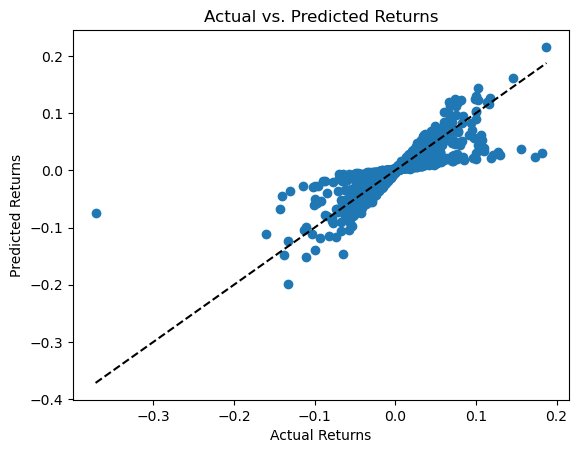

In [56]:
# Create a scatter plot of predicted vs. actual values
plt.scatter(y_linear, predicted_linear)
plt.xlabel("Actual Returns")
plt.ylabel("Predicted Returns")
plt.title("Actual vs. Predicted Returns")

# Add a diagonal line, to indicate where the points would lie if the predictions were perfect
plt.plot([y_linear.min(), y_linear.max()], [y_linear.min(), y_linear.max()], 'k--')

plt.savefig('./Images/linear_plot')

In [57]:
# Compute the metrics for the linear regression model
score = model_linear.score(X_linear, y_linear, sample_weight=None)
r2 = r2_score(y_linear, predicted_linear)
mse = mean_squared_error(y_linear, predicted_linear)
rmse = np.sqrt(mse)
std = np.std(y_linear)

---------------

### GARCH
*Additional ML model not covered in class*

In [58]:
# Create the returns dataframe based on the actual_returns of the df_ml dataframe
returns = df_ml['actual_returns']

In [59]:
# Set up the GARCH model
model_garch = arch_model(returns, mean="Zero", vol="GARCH", p=1, q=1)

In [60]:
# Fit the GARCH Model
res = model_garch.fit(disp="off")
# Summarize the model results
res.summary()

C:\Users\boris\anaconda3\envs\dev\lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001353. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  data_scale_warning.format(orig_scale, rescale), DataScaleWarning


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:         actual_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                      GARCH   Log-Likelihood:                3003.59
Distribution:                  Normal   AIC:                          -6001.18
Method:            Maximum Likelihood   BIC:                          -5985.12
                                        No. Observations:                 1562
Date:                Thu, Jul 13 2023   Df Residuals:                     1562
Time:                        12:41:12   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      1.0235e-04  2.912e-05      3.514  4.407e-04 [4.527e-05,1.594e-04]
alpha[1]       0.1027  3.927e-02      2.616  8.902e-03   [2.575e-02,  0.180]
beta[1]        0.8278  3.597e-02     23.015 3.303e-117     [  0.757,  0.898]
============================================================================

Covariance estimator: robust
"""

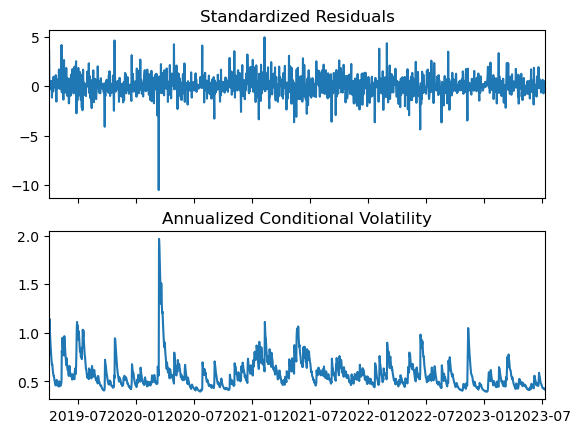

In [61]:
# Plot the model estimate of annualized volatility
fig_garch = res.plot(annualize='D')
# Save the plot
plt.savefig('./Images/garch.png')

In [69]:
# Forecasting from GARCH
# Construct Volatility Forecasts for the next 7 days
forecast_horizon = 7
# Take the last day of the data we used above. 
# If forecast horizon is 3, then the resulting 'h.1', 'h.2', and 'h.3' 
# are the forecasts for the following 7 days.
forecasts = res.forecast(start='2023-07-11', horizon=forecast_horizon)
forecasts

C:\Users\boris\anaconda3\envs\dev\lib\site-packages\arch\__future__\_utility.py:21: FutureWarning: 
The default for reindex is True. After September 2021 this will change to
False. Set reindex to True or False to silence this message. Alternatively,
you can use the import comment

from arch.__future__ import reindexing

to globally set reindex to True and silence this warning.

  FutureWarning,


In [70]:
# Annualize the forecast
intermediate = np.sqrt(forecasts.variance.dropna() * 252)
intermediate

,h.1,h.2,h.3,h.4,h.5,h.6,h.7
date,,,,,,,
2023-07-11 00:00:00+00:00,0.411663,0.428358,0.44333,0.456821,0.469027,0.480107,0.490192


In [71]:
final = intermediate.dropna().T
final

date,2023-07-11 00:00:00+00:00
h.1,0.411663
h.2,0.428358
h.3,0.443330
h.4,0.456821
h.5,0.469027
h.6,0.480107
h.7,0.490192


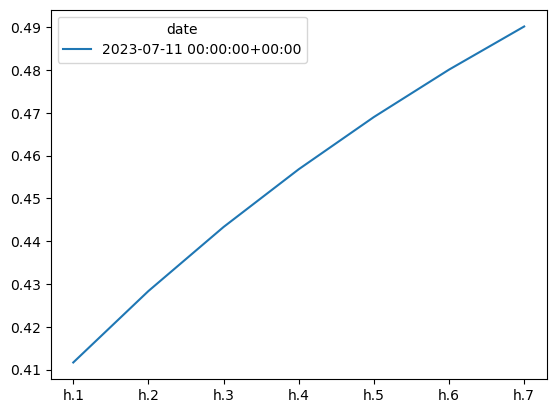

In [72]:
final_garch = final.plot()
plt.savefig('./Images/final_garch_plot.png')

-----------------------------------------------------------------------------------------------------

### Scikit-learn: Support Vector Machines (SVM)

In [75]:
# Calculate the daily returns using the closing prices and the pct_change function
trading_df = df_stock.copy()
trading_df["actual_returns"] = trading_df["Close"].pct_change()

# Display sample data
trading_df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2019-04-01 00:00:00+00:00,4105.362305,4164.953125,4096.901367,4158.183105,10157794171,0.0,0.0,NaN
2019-04-02 00:00:00+00:00,4156.919434,4905.954590,4155.316895,4879.877930,21315047816,0.0,0.0,0.173560
2019-04-03 00:00:00+00:00,4879.958008,5307.003418,4876.621094,4973.021973,22899891582,0.0,0.0,0.019087
2019-04-04 00:00:00+00:00,4971.307617,5063.159668,4836.793945,4922.798828,18251810240,0.0,0.0,-0.010099
2019-04-05 00:00:00+00:00,4922.806152,5053.509766,4919.491699,5036.681152,16837325387,0.0,0.0,0.023134


In [76]:
# Drop all NaN values from the DataFrame
trading_df = trading_df.dropna()

# Review the DataFrame
display(trading_df.head())
display(trading_df.tail())

,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2019-04-02 00:00:00+00:00,4156.919434,4905.954590,4155.316895,4879.877930,21315047816,0.0,0.0,0.173560
2019-04-03 00:00:00+00:00,4879.958008,5307.003418,4876.621094,4973.021973,22899891582,0.0,0.0,0.019087
2019-04-04 00:00:00+00:00,4971.307617,5063.159668,4836.793945,4922.798828,18251810240,0.0,0.0,-0.010099
2019-04-05 00:00:00+00:00,4922.806152,5053.509766,4919.491699,5036.681152,16837325387,0.0,0.0,0.023134
2019-04-06 00:00:00+00:00,5036.792969,5205.821777,4992.222168,5059.817383,16929795194,0.0,0.0,0.004594


,Open,High,Low,Close,Volume,Dividends,Stock Splits,actual_returns
date,,,,,,,,
2023-07-07 00:00:00+00:00,29907.998047,30434.644531,29777.285156,30342.265625,13384770155,0.0,0.0,0.014475
2023-07-08 00:00:00+00:00,30346.921875,30374.437500,30080.160156,30292.541016,7509378699,0.0,0.0,-0.001639
2023-07-09 00:00:00+00:00,30291.611328,30427.589844,30085.591797,30171.234375,7903327692,0.0,0.0,-0.004005
2023-07-10 00:00:00+00:00,30172.423828,31026.083984,29985.394531,30414.470703,14828209155,0.0,0.0,0.008062
2023-07-11 00:00:00+00:00,30417.632812,30788.314453,30358.097656,30620.951172,12151839152,0.0,0.0,0.006789


#### Generating the Features and Target Sets

##### Creating the Features Set

In [77]:
# Define a window size of 4
short_window = 4

# Create an SMA that uses short_window, and assign it to a new column named “sma_fast”
trading_df["sma_fast"] = trading_df["Close"].rolling(window=short_window).mean()

In [78]:
# Define a window size of 20
long_window = 20

# Create an SMA that uses long_window, and assign it to a new columns named “sma_slow”
trading_df["sma_slow"] = trading_df["Close"].rolling(window=long_window).mean()

In [79]:
# Drop the NaNs using dropna()
trading_df = trading_df.dropna()

In [81]:
# Assign a copy of the `sma_fast` and `sma_slow` columns to a new DataFrame called `X`
X = trading_df[["sma_fast", "sma_slow"]].shift().dropna().copy()

# Display sample data
display(X.head())
display(X.tail())

,sma_fast,sma_slow
date,,
2019-04-22 00:00:00+00:00,5313.653931,5155.896631
2019-04-23 00:00:00+00:00,5338.898804,5181.870996
2019-04-24 00:00:00+00:00,5406.036255,5211.838013
2019-04-25 00:00:00+00:00,5437.781372,5238.941406
2019-04-26 00:00:00+00:00,5411.777466,5247.633130


,sma_fast,sma_slow
date,,
2023-07-07 00:00:00+00:00,30589.381348,29761.296387
2023-07-08 00:00:00+00:00,30385.837891,29952.875879
2023-07-09 00:00:00+00:00,30264.577637,30150.692285
2023-07-10 00:00:00+00:00,30178.844727,30316.702539
2023-07-11 00:00:00+00:00,30305.127930,30421.051660


##### Creating the Target Set

In [82]:
# Create a new column in the `trading_df` called "signal" setting its value to zero.
trading_df["signal"] = 0.0

# Create the signal to buy
trading_df.loc[(trading_df["actual_returns"] >= 0), "signal"] = 1

# Create the signal to sell
trading_df.loc[(trading_df["actual_returns"] < 0), "signal"] = -1

# Copy the new "signal" column to a new Series called `y`.
y = trading_df["signal"].copy()

#### Split the Data into Training and Testing Sets

In [83]:
# Select the start of the training period
training_begin = X.index.min()

# Display the training begin date
print(training_begin)

2019-04-22 00:00:00+00:00


In [104]:
# Select the ending period for the training data with an offset of 18 months
training_end = X.index.min() + DateOffset(months=24)

# Display the training end date
print(training_end)

2021-04-22 00:00:00+00:00


In [105]:
# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

In [106]:
# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end:]
y_test = y.loc[training_end:]

#### Standardize the Data

In [107]:
# Create a StandardScaler instance
scaler = StandardScaler()
 
# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)
 
# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

##### Using Machine Learning Into a Trading Strategy

In [108]:
# Create the classifier model
svm_model = svm.SVC()

# Fit the model to the data using X_train_scaled and y_train
svm_model = svm_model.fit(X_train_scaled, y_train)

# Use the trained model to predict the trading signals for the training data
training_signal_predictions = svm_model.predict(X_train_scaled)

# Display the sample predictions
training_signal_predictions[:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [109]:
# Evaluate the model using a classification report
training_report = classification_report(y_train, training_signal_predictions)

# Display report
print(training_report)

              precision    recall  f1-score   support

        -1.0       0.55      0.03      0.06       342
         1.0       0.54      0.98      0.69       390

    accuracy                           0.54       732
   macro avg       0.54      0.50      0.38       732
weighted avg       0.54      0.54      0.40       732



##### Backtesting a Machine Learning Trading Algorithm

In [110]:
# Use the trained model to predict the trading signals for the testing data.
testing_signal_predictions = svm_model.predict(X_test_scaled)

In [111]:
# Evaluate the model's ability to predict the trading signal for the testing data
testing_report = classification_report(y_test, testing_signal_predictions)

# Display the report
print(testing_report)

              precision    recall  f1-score   support

        -1.0       0.55      0.06      0.10       416
         1.0       0.49      0.95      0.65       395

    accuracy                           0.49       811
   macro avg       0.52      0.50      0.37       811
weighted avg       0.52      0.49      0.37       811



##### Visually Compare the Actual and Predicted Returns

In [112]:
# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

predictions_df["predicted_signal"] = testing_signal_predictions

predictions_df["actual_returns"] = trading_df["actual_returns"]

predictions_df["trading_algorithm_returns"] = (
    predictions_df["actual_returns"] * predictions_df["predicted_signal"]
)

# Review the DataFrame
predictions_df.head()

,predicted_signal,actual_returns,trading_algorithm_returns
date,,,
2021-04-22 00:00:00+00:00,1.0,-0.039769,-0.039769
2021-04-23 00:00:00+00:00,1.0,-0.012917,-0.012917
2021-04-24 00:00:00+00:00,1.0,-0.020409,-0.020409
2021-04-25 00:00:00+00:00,1.0,-0.020911,-0.020911
2021-04-26 00:00:00+00:00,1.0,0.102389,0.102389


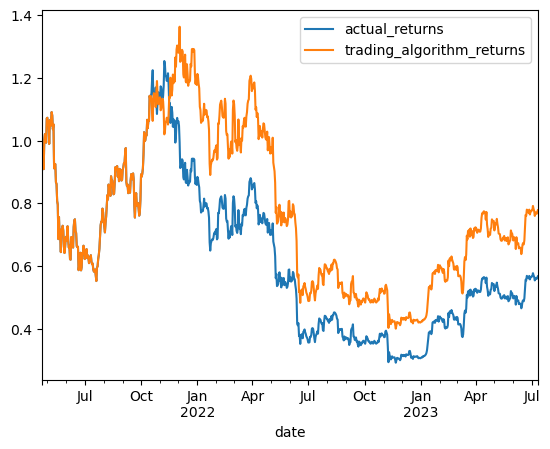

In [113]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()
plt.savefig("./Images/svm.png") 

------------------

## Neural Networks - Tensorflow, Keras

In [114]:
# Create a new column in the `trading_df` called "signal" setting its value to zero.
X_df["signal"] = 0.0

# Create the signal to buy
X_df.loc[(X_df["actual_returns"] >= 0), "signal"] = 1

# Create the signal to sell
X_df.loc[(X_df["actual_returns"] < 0), "signal"] = 0

y_nn = X_df["signal"].copy()

In [115]:
# Apply Train-test-split to get tarin and test data
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X_nn, y_nn, random_state=1)

In [116]:
 # Create the StandardScaler instance
X_scaler_nn = StandardScaler()

# Fit the scaler to the features training dataset
X_scaler_nn.fit(X_train_nn)

# Scale both the training and testing data from the features dataset
X_train_scaled_nn = X_scaler_nn.transform(X_train_nn)
X_test_scaled_nn = X_scaler_nn.transform(X_test_nn)

In [117]:
# Define the the number of inputs (features) to the model
number_input_features = len(X_nn.columns)

In [118]:
# Define the number of hidden nodes for the first hidden layer
hidden_nodes_layer1 =  12

# Define the number of hidden nodes for the second hidden layer
hidden_nodes_layer2 = 6

# Create the Sequential model instance
nn = Sequential()


In [119]:
# Add the first hidden layer specifying the number of inputs, the number of hidden nodes, and the activation function
nn.add(Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu"))

# Add the second hidden layer specifying the number of hidden nodes and the activation function
nn.add(Dense(units=hidden_nodes_layer2, activation="relu"))

# Add the output layer to the model specifying the number of output neurons and activation function
nn.add(Dense(units=1, activation="sigmoid"))

In [120]:
# Display the Sequential model summary
nn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                72        
                                                                 
 dense_1 (Dense)             (None, 6)                 78        
                                                                 
 dense_2 (Dense)             (None, 1)                 7         
                                                                 
Total params: 157
Trainable params: 157
Non-trainable params: 0
_________________________________________________________________


In [121]:
# Compile the Sequential model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [122]:
# Fit the model using 50 epochs and the training data
num_epochs = 100
model_1 = nn.fit(X_train_scaled_nn, y_train_nn, epochs=num_epochs)

Epoch 1/100
37/37 [==============================] - 1s 2ms/step - loss: 0.7004 - accuracy: 0.4774
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6958 - accuracy: 0.5115
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6946 - accuracy: 0.5218
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6940 - accuracy: 0.5175
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6937 - accuracy: 0.5201
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6936 - accuracy: 0.5184
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6934 - accuracy: 0.5269
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.5218
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.5209
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.5260
Epoch 11/

In [123]:
# Evaluate the model loss and accuracy metrics using the evaluate method and the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled_nn, y_test_nn)

# Display the model loss and accuracy results
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

13/13 [==============================] - 0s 2ms/step - loss: 0.4142 - accuracy: 0.9028
Loss: 0.4142133593559265, Accuracy: 0.9028133153915405


In [124]:
# Set the model's file path
file_path = Path('Resources/nn.h5')

# Export your model to a HDF5 file
nn.save(file_path)

----------

## Prophet

In [125]:
# Reset index and rename columns for Prophet model ingestion
df = df_profolio.reset_index()
df.columns = ["ds", "y"]
display(df.shape)
display(df.head())
display(df.tail())

(1563, 2)

,ds,y
0,2019-04-01 00:00:00+00:00,4158.183105
1,2019-04-02 00:00:00+00:00,4879.877930
2,2019-04-03 00:00:00+00:00,4973.021973
3,2019-04-04 00:00:00+00:00,4922.798828
4,2019-04-05 00:00:00+00:00,5036.681152


,ds,y
1558,2023-07-07 00:00:00+00:00,30342.265625
1559,2023-07-08 00:00:00+00:00,30292.541016
1560,2023-07-09 00:00:00+00:00,30171.234375
1561,2023-07-10 00:00:00+00:00,30414.470703
1562,2023-07-11 00:00:00+00:00,30620.951172


In [126]:
# Establish localisation for the ds column timezone
df['ds'] = df['ds'].dt.tz_localize(None)

In [127]:
# Sort the ds columns
df = df.sort_values(by=["ds"], ascending=True)

# Display sample data from head and tail
display(df.head(10))
display(df.tail(10))

,ds,y
0,2019-04-01,4158.183105
1,2019-04-02,4879.877930
2,2019-04-03,4973.021973
3,2019-04-04,4922.798828
4,2019-04-05,5036.681152
5,2019-04-06,5059.817383
6,2019-04-07,5198.896973
7,2019-04-08,5289.770996
8,2019-04-09,5204.958496
9,2019-04-10,5324.551758


,ds,y
1553,2023-07-02,30620.769531
1554,2023-07-03,31156.439453
1555,2023-07-04,30777.582031
1556,2023-07-05,30514.166016
1557,2023-07-06,29909.337891
1558,2023-07-07,30342.265625
1559,2023-07-08,30292.541016
1560,2023-07-09,30171.234375
1561,2023-07-10,30414.470703
1562,2023-07-11,30620.951172


In [128]:
# Call the Prophet function, store as an object
pr_model = Prophet()

# Fit the Prophet model.
pr_model.fit(df)

12:45:25 - cmdstanpy - INFO - Chain [1] start processing
12:45:26 - cmdstanpy - INFO - Chain [1] done processing


In [129]:
# Create a future dataframe to hold predictions
# Make the prediction go out as far as 1000 hours (approx 40 days)
pr_future_trends = pr_model.make_future_dataframe(periods=1000, freq="H")

In [130]:
# View the last five rows of the predictions
pr_future_trends.tail()

,ds
2558,2023-08-21 12:00:00
2559,2023-08-21 13:00:00
2560,2023-08-21 14:00:00
2561,2023-08-21 15:00:00
2562,2023-08-21 16:00:00


In [131]:
# Make the predictions for the trend data using the future_trends DataFrame
pr_forecast_trends1 = pr_model.predict(pr_future_trends)

# Display the first five rows of the forecast DataFrame
pr_forecast_trends1.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-04-01,2030.883180,3084.332845,10718.448813,2030.883180,2030.883180,4580.600531,4580.600531,4580.600531,10.121768,10.121768,10.121768,4570.478763,4570.478763,4570.478763,0.0,0.0,0.0,6611.483710
1,2019-04-02,2116.757071,2989.562775,10682.532827,2116.757071,2116.757071,4582.320618,4582.320618,4582.320618,2.706129,2.706129,2.706129,4579.614489,4579.614489,4579.614489,0.0,0.0,0.0,6699.077689
2,2019-04-03,2202.630963,3105.707929,10577.741983,2202.630963,2202.630963,4618.307257,4618.307257,4618.307257,50.386606,50.386606,50.386606,4567.920651,4567.920651,4567.920651,0.0,0.0,0.0,6820.938220
3,2019-04-04,2288.504854,2576.075349,10609.440412,2288.504854,2288.504854,4488.702650,4488.702650,4488.702650,-49.014801,-49.014801,-49.014801,4537.717451,4537.717451,4537.717451,0.0,0.0,0.0,6777.207504
4,2019-04-05,2374.378746,2979.617586,10718.774014,2374.378746,2374.378746,4475.310519,4475.310519,4475.310519,-16.264307,-16.264307,-16.264307,4491.574826,4491.574826,4491.574826,0.0,0.0,0.0,6849.689265


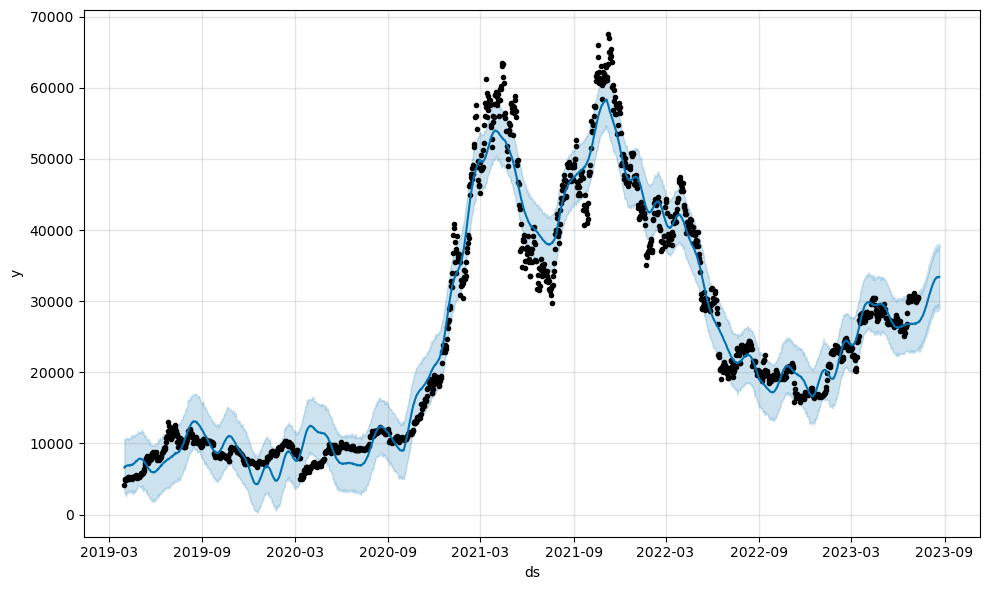

In [132]:
# Plot the Prophet predictions for the Mercado trends data
pr_fig = pr_model.plot(pr_forecast_trends1)
# Save the plot
plt.savefig('./Images/prophet.png')
# Display the plot
plt.show()

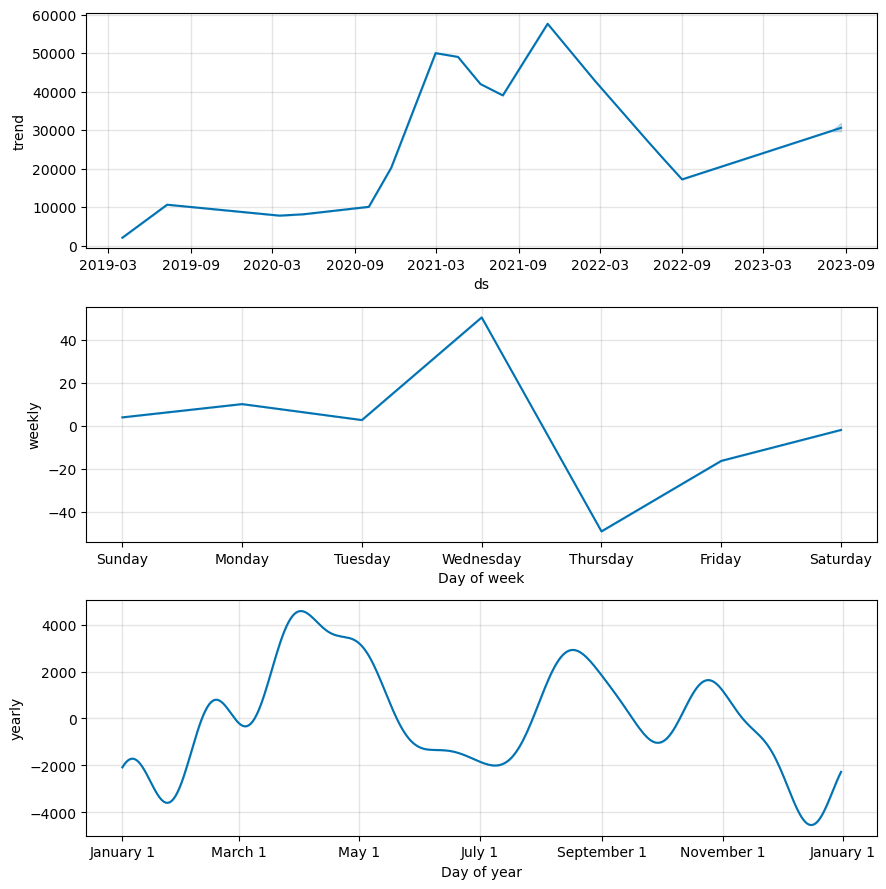

In [133]:
# Use the plot_components function to visualize the forecast results 
pr_figures = pr_model.plot_components(pr_forecast_trends1)
# Save the plot
plt.savefig('./Images/prophet_components.png')

In [134]:
# At this point, it's useful to set the `datetime` index of the forecast data.
pr_forecast_trends1 = pr_forecast_trends1.set_index(["ds"])

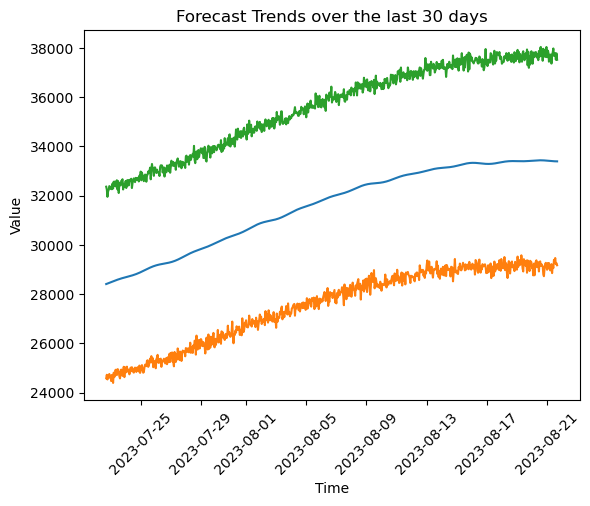

In [135]:
# Plot the yhat, yhat_lower, and yhat_upper columns over the last 30 days
pr_plot_last30days = plt.plot(pr_forecast_trends1[["yhat", "yhat_lower", "yhat_upper"]].iloc[-720:, :])
plt.title("Forecast Trends over the last 30 days")
plt.xlabel("Time")
plt.ylabel("Value")
plt.xticks(rotation=45)

# Save the plot
plt.savefig('./Images/prophet_predict.png')


In [136]:
# The DataFrame should include the columns yhat_upper, yhat_lower, and yhat
pr_forecast_aug_2023 = pr_forecast_trends1.loc["2023-07-13":"2023-08-13"][["yhat_upper", "yhat_lower", "yhat"]]

# Replace the column names to something less technical sounding
pr_forecast_aug_2023 = pr_forecast_aug_2023.rename(
    columns={
        "yhat_upper": "Best Case",
        "yhat_lower": "Worst Case", 
        "yhat": "Most Likely Case"
    }
)

# Review the last five rows of the DataFrame
pr_forecast_aug_2023.tail()

,Best Case,Worst Case,Most Likely Case
ds,,,
2023-08-13 19:00:00,37346.847561,28699.347506,33112.963995
2023-08-13 20:00:00,37135.870549,28937.666508,33115.933548
2023-08-13 21:00:00,37335.468488,28624.058291,33118.694112
2023-08-13 22:00:00,37174.472943,28923.197648,33121.266950
2023-08-13 23:00:00,37244.474953,29039.054117,33123.675872


In [137]:
# Display the average forecasted price for March 2021
pr_forecast_aug_2023.mean()

Best Case           33870.447929
Worst Case          26015.798321
Most Likely Case    29956.412716
dtype: float64

------------------

# 5. Model Reports:
*Summary of outputs and comparison*

## Logistic Regression

In [149]:
print(f"{report_lr}\n")
print(f"After increasing the dataset:\n\n {report_lr_new}\n")
print(f"After resampling the dataset:\n\n {report_resample}")

                   pre       rec       spe        f1       geo       iba       sup

        0.0       0.00      0.00      1.00      0.00      0.00      0.00       190
        1.0       0.51      1.00      0.00      0.68      0.00      0.00       201

avg / total       0.26      0.51      0.49      0.35      0.00      0.00       391


After increasing the dataset:

                    pre       rec       spe        f1       geo       iba       sup

        0.0       0.00      0.00      1.00      0.00      0.00      0.00       185
        1.0       0.98      1.00      0.00      0.99      0.00      0.00      9187

avg / total       0.96      0.98      0.02      0.97      0.00      0.00      9372


After resampling the dataset:

                    pre       rec       spe        f1       geo       iba       sup

        0.0       0.49      1.00      0.00      0.65      0.00      0.00       190
        1.0       0.00      0.00      1.00      0.00      0.00      0.00       201

avg / total  

## Linear Regression

In [150]:
# Print releveant metrics.
print(f"The score is {score}.")
print(f"The r2 is {r2}.")
print(f"The mean squared error is {mse}.")
print(f"The root mean squared error is {rmse}.")
print(f"The standard deviation is {std}.")

The score is 0.6877693669032925.
The r2 is 0.6877693669032925.
The mean squared error is 0.00042232100527336147.
The root mean squared error is 0.02055045024502776.
The standard deviation is 0.03677761706659004.


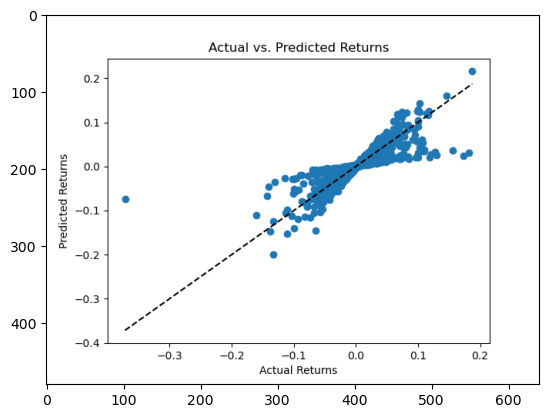

In [151]:
img_linear = mpimg.imread('./Images/linear_plot.png')
imgplot_linear = plt.imshow(img_linear)
plt.show()

## GARCH

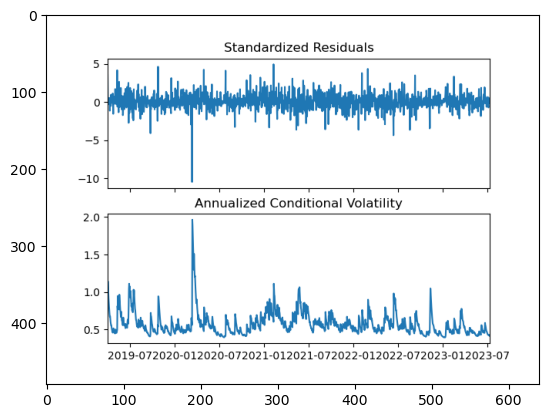

In [152]:
img_garch = mpimg.imread('./Images/garch.png')
imgplot_garch = plt.imshow(img_garch)
plt.show()

In [153]:
print(final)

date  2023-07-11 00:00:00+00:00
h.1                    0.411663
h.2                    0.428358
h.3                    0.443330
h.4                    0.456821
h.5                    0.469027
h.6                    0.480107
h.7                    0.490192


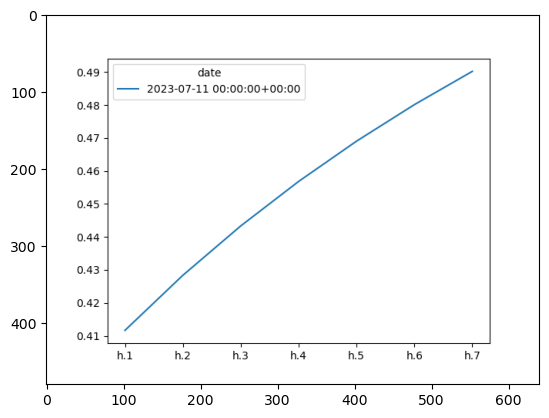

In [154]:
img_garch_final = mpimg.imread('./Images/final_garch_plot.png')
imgplot_garch_final = plt.imshow(img_garch_final)
plt.show()

## SVM

In [155]:
print(training_report)

              precision    recall  f1-score   support

        -1.0       0.55      0.03      0.06       342
         1.0       0.54      0.98      0.69       390

    accuracy                           0.54       732
   macro avg       0.54      0.50      0.38       732
weighted avg       0.54      0.54      0.40       732



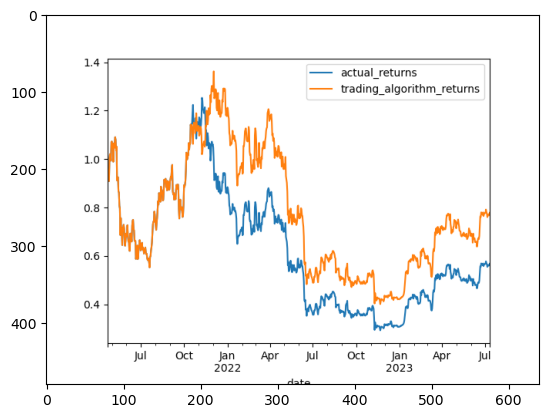

In [156]:
img_svm = mpimg.imread('./Images/svm.png')
imgplot_svm = plt.imshow(img_svm)
plt.show()

## Neural Network ML

In [157]:
# Display the model loss and accuracy results
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

Loss: 0.4142133593559265, Accuracy: 0.9028133153915405


## Prophet

In [158]:
print(pr_forecast_aug_2023.mean())

Best Case           33870.447929
Worst Case          26015.798321
Most Likely Case    29956.412716
dtype: float64


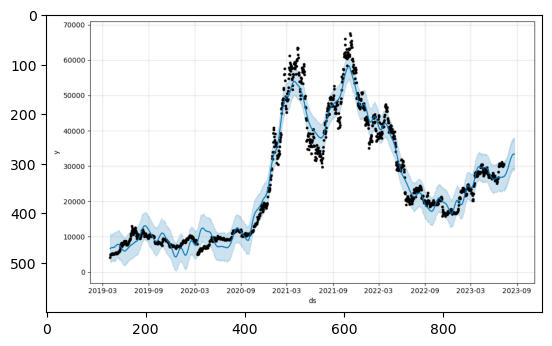

In [159]:
img_pr= mpimg.imread('./Images/prophet.png')
imgplot_pr = plt.imshow(img_pr)
plt.show()

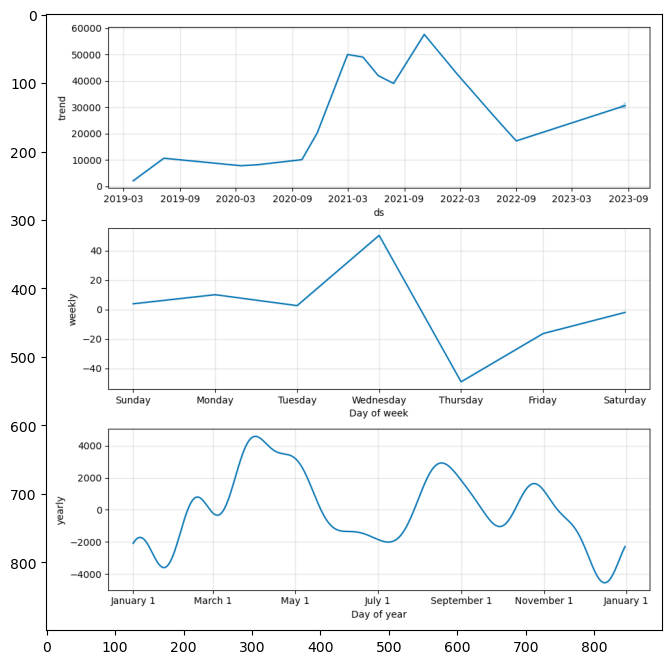

In [160]:
img_pr_com= mpimg.imread('./Images/prophet_components.png')
plt.figure(figsize=(8, 8))
imgplot_pr_com = plt.imshow(img_pr_com)
plt.show()

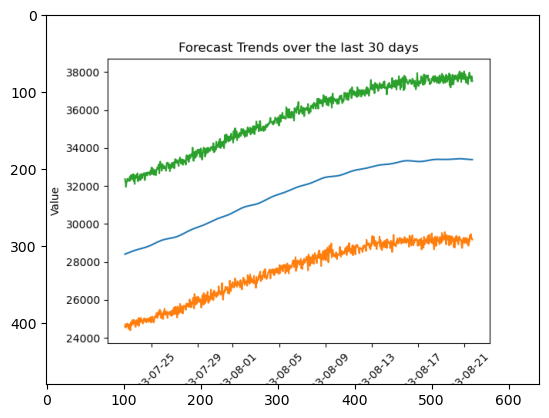

In [161]:
img_pr_predict= mpimg.imread('./Images/prophet_predict.png')
imgplot_pr_predict = plt.imshow(img_pr_predict)
plt.show()

------------

# 6. Deep Dive: Supervised Linear Regression Forecast vs Prophet Forecast

In [162]:
# Create a StandardScaler instance
data_Close = df_stock['Close'].to_numpy().reshape(-1,1)
scaler_Close = StandardScaler()

# Fit the scaler to the features training dataset
scaler_Close.fit(data_Close)
X_Close = scaler_Close.transform(data_Close)
print(scaler_Close.mean_)
print(scaler_Close.var_)
print(scaler_Close.n_samples_seen_)

[24937.94931122]
[2.65730842e+08]
1563


In [163]:
# Manually split data into training/testing data
test_ratio = 0.25
input_dim = 30 # 30 days of input data
output_dim = 1 # 1 day of output data

# Convert Vector to Array
X_Close = X_Close.reshape(-1,1)

N, p = X_Close.shape
input_dim = np.uint32(input_dim)
output_dim = np.uint32(output_dim)

if N<input_dim+output_dim or p !=1:
    print(f'check {input_dim}+{output_dim}>={N}?')
    print(f'check {p} == 1?')
    print('Error: Check Row input_dim+out <= Number and V should be column matrix')
M = np.zeros([N-input_dim-output_dim+1, input_dim+output_dim])
print(M.shape)
display(M)

(1533, 31)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [164]:
# Create the Matrix required for the split inot training/testing data
for i in range(N-input_dim-output_dim+1):
    M[i,:] = X_Close[i : input_dim+output_dim+i].flat # add the window to the output matrix 
    M
M_Close = M
print(M.shape)
display(M)

(1533, 31)


array([[-1.27473431, -1.23046196, -1.22474804, ..., -1.20791923,
        -1.20157776, -1.19838962],
       [-1.23046196, -1.22474804, -1.22782898, ..., -1.20157776,
        -1.19838962, -1.19209645],
       [-1.22474804, -1.22782898, -1.22084287, ..., -1.19838962,
        -1.19209645, -1.17596237],
       ...,
       [ 0.09462007,  0.05602581,  0.06148108, ...,  0.33152767,
         0.32847731,  0.32103576],
       [ 0.05602581,  0.06148108,  0.05917034, ...,  0.32847731,
         0.32103576,  0.33595709],
       [ 0.06148108,  0.05917034,  0.06016588, ...,  0.32103576,
         0.33595709,  0.34862363]])

In [165]:
# Train & Test data based on Ratio Split
n_row, n_col = M_Close.shape

X = M_Close[:,0:n_col-1] 
y = M_Close[:,-1] # Only the last column we created 

train_ratio = 1-test_ratio
n_train = int(n_row*train_ratio) 

# Create Train Data
X_train = X[0:n_train][:]
y_train = y[0:n_train][:]    

# Create Test Data
X_test = X[n_train+1:][:] # this [:] must refer to all columns
y_test = y[n_train+1:][:]   

print("Training sample")
print(str(X_train.shape))
print("Testing sample")
print(str(X_test.shape)) 

Training sample
(1149, 30)
Testing sample
(383, 30)


## Execute Linear Regression

In [166]:
from sklearn import linear_model
lr_model = linear_model.LinearRegression()
lr_model.fit(X_train,y_train)
y_pred_lr = lr_model.predict(X_test)
y_pred_lr.shape

(383,)

## Evaluate Model Performance

In [167]:
print(f'Loss Absolute Error: {np.mean(np.abs(np.array(scaler_Close.inverse_transform(y_test.reshape(-1,1))) - np.array(scaler_Close.inverse_transform(y_pred_lr.reshape(-1,1)))))}')
print(f'Loss Absolute Percentage Error: {np.mean(np.abs((np.array(scaler_Close.inverse_transform(y_test.reshape(-1,1))) - np.array(scaler_Close.inverse_transform(y_pred_lr.reshape(-1,1))))/np.array(scaler_Close.inverse_transform(y_test.reshape(-1,1))))*100)} %')

Loss Absolute Error: 423.88171821348163
Loss Absolute Percentage Error: 1.8855285731977314 %


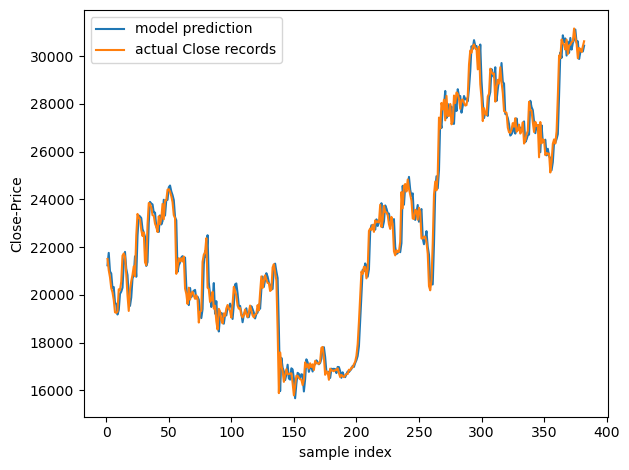

In [168]:
# PLot Prediction vs Actaul
t = np.arange(1,y_pred_lr.shape[0])
fig, ax = plt.subplots()
line1, = ax.plot(t, scaler_Close.inverse_transform(y_pred_lr.reshape(-1,1)[t]), label='model prediction')
line2, = ax.plot(t, scaler_Close.inverse_transform(y_test.reshape(-1,1)[t]), label='actual Close records')    
plt.xlabel('sample index')
plt.ylabel('Close-Price')
ax.legend()
fig.tight_layout()
plt.show()

In [169]:
lr_y_pred = scaler_Close.inverse_transform(y_pred_lr.reshape(-1,1))
df_y_pred = pd.DataFrame(lr_y_pred)
df_y_pred = df_y_pred.set_index(df_stock.index[-y_pred_lr.shape[0]:])
df_y_pred.columns = ['LR_pred']
df_y_pred

,LR_pred
date,
2022-06-24 00:00:00+00:00,21344.476621
2022-06-25 00:00:00+00:00,21236.795258
2022-06-26 00:00:00+00:00,21756.344397
2022-06-27 00:00:00+00:00,20979.795287
2022-06-28 00:00:00+00:00,20892.412224
...,...
2023-07-07 00:00:00+00:00,29879.659368
2023-07-08 00:00:00+00:00,30165.051744
2023-07-09 00:00:00+00:00,30202.892751


In [170]:
df_lr_forecast =pd.concat([df_stock['Close'],df_y_pred['LR_pred']],axis=1)
df_lr_forecast.hvplot()

:NdOverlay   [Variable]
   :Curve   [date]   (value)

In [171]:
# Create Prophet dataframe

df_prohpet = df_stock['Close']
df_prophet = df_prohpet.reset_index() # YOUR CODE HERE

# Label the columns ds and y so that the syntax is recognized by Prophet
# YOUR CODE HERE
df_prophet.columns = ['ds','y']

# Remove Timezone
df_prophet['ds']= df_prophet['ds'].dt.tz_localize(None)

# Drop an NaN values from the prophet_df DataFrame
df_prophet = df_prophet.dropna()# YOUR CODE HERE

# View the first and last five rows of the mercado_prophet_df DataFrame
# YOUR CODE HERE
display(df_prophet.head(5))
display(df_prophet.tail(5))

,ds,y
0,2019-04-01,4158.183105
1,2019-04-02,4879.877930
2,2019-04-03,4973.021973
3,2019-04-04,4922.798828
4,2019-04-05,5036.681152


,ds,y
1558,2023-07-07,30342.265625
1559,2023-07-08,30292.541016
1560,2023-07-09,30171.234375
1561,2023-07-10,30414.470703
1562,2023-07-11,30620.951172


In [172]:
# Call the Prophet function, store as an object
pr_model1 = Prophet()

forecast_periods = 60

# Fit the Prophet model.
pr_model1.fit(df_prophet)

# Create a future dataframe to hold predictions
# Make the prediction go out as far as 60 days
pr_future_trends = pr_model1.make_future_dataframe(periods=forecast_periods, freq="D")

# Make the predictions for the trend data using the future_trends DataFrame
df_prophet_forecast = pr_model1.predict(pr_future_trends) # YOUR CODE HERE

12:50:19 - cmdstanpy - INFO - Chain [1] start processing
12:50:19 - cmdstanpy - INFO - Chain [1] done processing


In [173]:
prophet_plot = df_prophet_forecast[['yhat']].set_index(df_prophet_forecast['ds'])
prophet_plot.hvplot(label='Prophet') * df_stock['Close'].hvplot(label='Close')

:Overlay
   .Curve.Prophet :Curve   [ds]   (yhat)
   .Curve.Close   :Curve   [date]   (Close)

## Train the Linear Regression Using Prohet's Forecasted Data

In [174]:
# Scale and fit the new data input
df_prophet_forecast_yhat = df_prophet_forecast['yhat'].to_numpy().reshape(-1,1)
scaler_Close.fit(df_prophet_forecast_yhat)
prophet_yhat_scaled = scaler_Close.transform(df_prophet_forecast_yhat)

# Update train data
X_test_future = np.append(X_test,prophet_yhat_scaled[-forecast_periods:]) 

#Create new Matrix of the data
forecast_periods_int = np.uint32(forecast_periods)
forecast_periods_int_by2 = np.uint32(forecast_periods/2)

M_future = np.zeros([forecast_periods, forecast_periods_int_by2])
print(M_future.shape)
display(M_future)

(60, 30)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [175]:
# Fill the data for training/testing
for i in range(forecast_periods_int_by2):
    M_future[i,:] = X_test_future[i : forecast_periods_int_by2+i].flat 
    M_future
M_Close_future = M_future[:30]
print(M_Close_future.shape)

# Predict the the new forecast
y_pred_prophet_forecast = lr_model.predict(M_Close_future)

(30, 30)


In [176]:
# Evaluate the new Prediction
print(f'Loss Absolute Error: {np.mean(np.abs(np.array(scaler_Close.inverse_transform(M_Close_future[:,0].reshape(-1,1))) - np.array(scaler_Close.inverse_transform(y_pred_prophet_forecast.reshape(-1,1)))))}')
print(f'Loss Absolute Percentage Error: {np.mean(np.abs((np.array(scaler_Close.inverse_transform(M_Close_future[:,0].reshape(-1,1))) - np.array(scaler_Close.inverse_transform(y_pred_prophet_forecast.reshape(-1,1))))/np.array(scaler_Close.inverse_transform(M_Close_future[:,0].reshape(-1,1))))*100)} %')

Loss Absolute Error: 583.6691816698562
Loss Absolute Percentage Error: 2.1248128533015502 %


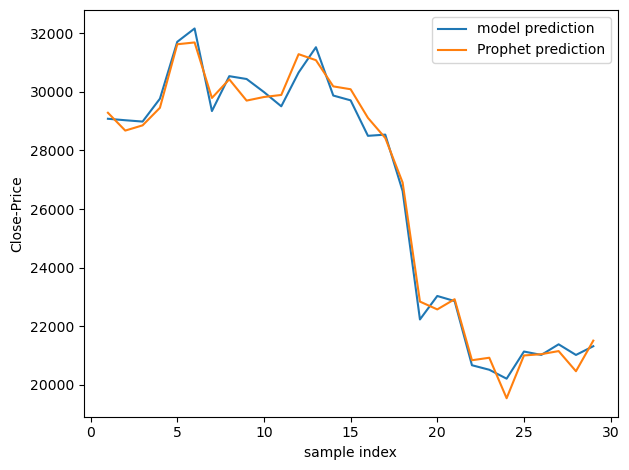

In [177]:
# Visualize the Evaluation
t = np.arange(1,y_pred_prophet_forecast.shape[0])
fig, ax = plt.subplots()
line1, = ax.plot(t, scaler_Close.inverse_transform(y_pred_prophet_forecast.reshape(-1,1)[t]), label='model prediction')
line2, = ax.plot(t, scaler_Close.inverse_transform(M_Close_future[:,0].reshape(-1,1)[t]), label='Prophet prediction')    
plt.xlabel('sample index')
plt.ylabel('Close-Price')
ax.legend()
fig.tight_layout()
plt.show()

In [178]:
# Create dataframe of new Preidction to concat with other data
prophet_y_future = scaler_Close.inverse_transform(y_pred_prophet_forecast[1:].reshape(-1,1))
df_prophet_y_future = pd.DataFrame(prophet_y_future)
df_prophet_forecast_ = df_prophet_forecast.rename(columns = {'ds':'date'})
df_prophet_y_future = df_prophet_y_future.set_index(df_prophet_forecast_['date'].iloc[-y_pred_prophet_forecast.shape[0]*2:-y_pred_prophet_forecast.shape[0]-1])
df_prophet_y_future.columns = ['y_pred_prophet_forecast']
df_prophet_y_future.head()

,y_pred_prophet_forecast
date,
2023-07-12,29080.327866
2023-07-13,29029.965879
2023-07-14,28984.702767
2023-07-15,29765.883675
2023-07-16,31706.402361


In [179]:
# Arrange data for concat
df_stock_tz = df_stock.reset_index()
df_stock_tz['date']= df_stock_tz['date'].dt.tz_localize(None)
df_stock_tz = df_stock_tz.set_index('date')

# Concat the new prediction with Prophet and Actual
df_lr_prophet_forecast_predict =pd.concat([df_stock_tz[['Close']],prophet_plot.iloc[:-30], df_prophet_y_future.iloc[:-5]],axis=1)

In [180]:
# Arrange data to concate new and old predictions
df_y_pred_tz = df_y_pred.reset_index()
df_y_pred_tz['date']= df_y_pred_tz['date'].dt.tz_localize(None)
df_y_pred_tz = df_y_pred_tz.set_index('date')
df_y_pred_tz = df_y_pred_tz.rename(columns = {'LR_pred':'y_pred_prophet_forecast'})

# Concate old and new predictions to previous data
df_prophet_y_future_old = pd.concat([df_y_pred_tz,df_prophet_y_future], axis=0, join ='inner')
df_prophet_y_future_old.tail()

,y_pred_prophet_forecast
date,
2023-08-05,21137.307781
2023-08-06,21021.728448
2023-08-07,21383.524410
2023-08-08,21020.613159
2023-08-09,21318.695565


In [181]:
# Visualize the new predictions vs Prophet and Actual
df_lr_prophet_forecast_predict_old = df_stock_tz[['Close']].hvplot(label='Actual', width=1000, height = 700, line_width=3) * prophet_plot.iloc[:-30].hvplot(label ='Prophet') * df_prophet_y_future_old.iloc[:-5].hvplot(label ='LR Predict', line_width=2, color ='black')
df_lr_prophet_forecast_predict_old

:Overlay
   .Curve.Actual     :Curve   [date]   (Close)
   .Curve.Prophet    :Curve   [ds]   (yhat)
   .Curve.LR_Predict :Curve   [date]   (y_pred_prophet_forecast)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
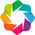

In [182]:
# Ensure it renders using the 'bokeh' backend
hv.extension('bokeh')

# Save the plot
hv.save(df_lr_prophet_forecast_predict_old, './Images/df_lr_prophet_forecast_predict_old.png')

-------------

# 7. Additional Work

## Sentiment Analysis APIs

**Fear and Greed Index:**
Categories: extreme fear, fear, neutral, greed, extream greed*
* "< 50" : Fear
* "= 50" : Neutral
* "> 50" : Greed

In [183]:
# Set up the sentiment dataframe based on the fear_and_greed index
sentiment = pd.DataFrame(
    fear_and_greed.get(), 
    index=['value','description','last_update'], 
    columns=['CNN Fear & Greed Index']
)
sentiment

,CNN Fear & Greed Index
value,79.542857
description,extreme greed
last_update,2023-07-12 23:59:58+00:00


In [184]:
sentiment.loc['description']

CNN Fear & Greed Index    extreme greed
Name: description, dtype: object

In [185]:
sentiment.iloc[[0]]

,CNN Fear & Greed Index
value,79.542857


-----------

## Connecting to external market to place orders

In [186]:
# Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")
# Create the Alpaca API object
api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    base_url= 'https://paper-api.alpaca.markets',    
    api_version = "v2"
)

## Alpaca Buy/Sell Functions

In [187]:
# Define Alpaca buy function for crypto/stocks

def buy_crypto(token,amount):
    quantity_bought = 0
    position_price = 0
    amount_paid = 0    
    buy = api.submit_order(
  symbol=token, 
  side='buy',
  notional=float(amount),
  type='market',
  time_in_force='gtc'
)
    buy_id = buy.id          
    buy_order_status = buy.status
    time.sleep(1)
    order = api.get_order(buy_id)
    print(f"Buy status: {buy.status}", end=""), time.sleep(1), print(".", end=""), time.sleep(0.5), print(".", end=""), time.sleep(0.5), print(".") 
    print(f"Buy id: {buy.id}", end=""), time.sleep(1), print(".", end=""), time.sleep(0.5), print(".", end=""), time.sleep(0.5), print(".")
    print(f"Order status: {order.status}"), time.sleep(1) 
    
    if str(order.status) == 'filled':
        quantity_bought = float(order.filled_qty)
        position_price = float(order.filled_avg_price)
        amount_paid = position_price * quantity_bought
        print(f"You have sucessfully purchased ${amount} worth of {token} at ${float(position_price)} per share. Your purchased shares equate to {float(quantity_bought)}.\n")
    else:
        print("Status pending...")        
    return quantity_bought, position_price, amount_paid

In [188]:
# Define Alpaca sell function for crypto/stocks

def sell_crypto(token):
    buy = api.submit_order(
  symbol=token, 
  side='sell',
  qty=float(quantity_bought),
  type='market',
  time_in_force='gtc'
)
    buy_id = buy.id          
    buy_order_status = buy.status  
    time.sleep(1)
    order = api.get_order(buy_id)    
    print(f"Sell status: {buy.status}", end=""), time.sleep(1), print(".", end=""), time.sleep(0.5), print(".", end=""), time.sleep(0.5), print(".")   
    print(f"Sell id: {buy.id}", end=""), time.sleep(1), print(".", end=""), time.sleep(0.5), print(".", end=""), time.sleep(0.5), print(".")
    print(f"Order status: {order.status}"), time.sleep(1) 
    
    if str(order.status) == 'filled':
        print(f"You have sucessfully sold {float(quantity_bought)} of {token}.")
    else:
        print("Status: pending.")    

---

## Analysing ML model output in conjunction with the sentiment to establish next steps to buy, sell or hold

### Implement Trading Strategy

In [200]:
# Prepare for order execution
token = 'BTCUSD'
amount = 1000
quantity_bought, position_price, amount_paid = buy_crypto(token, amount)

Buy status: pending_new...
Buy id: 3ac42b56-8a8b-41ca-9c1e-8334f63420cc...
Order status: filled
You have sucessfully purchased $1000 worth of BTCUSD at $30350.798973 per share. Your purchased shares equate to 0.031361827.



In [194]:
# Get today's price for BitCoin for comparison below
today_value = df_profolio['Close'].iloc[-1]

In [195]:
# Create dataframe of prophet forecast for use in the comparison
df_pr_forecast = pd.DataFrame(pr_forecast_aug_2023.mean(), index=['Best Case', 'Worst Case', 'Most Likely Case'], columns=['Forecasted Prices'])
df_pr_forecast

,Forecasted Prices
Best Case,33870.447929
Worst Case,26015.798321
Most Likely Case,29956.412716


In [196]:
# Create a variable for the LR prediction as 30 day average
LR_avg_pred = float(df_prophet_y_future.iloc[-30:].mean())
LR_avg_pred

26598.400151581453

In [197]:
sentiment['CNN Fear & Greed Index'].iloc[0]

79.5428571428572

## Buy/Sell Decision Based on Prophet Forecast

In [198]:
# Define and empty varibale for use in the if statement
whisper = ''

if (sentiment['CNN Fear & Greed Index'].iloc[0] > 50) and (today_value < df_pr_forecast['Forecasted Prices'].iloc[2]):
    whisper = "Buy"
    quantity_bought, position_price, amount_paid = buy_crypto(token, amount)
elif (sentiment['CNN Fear & Greed Index'].iloc[0] > 50) and (today_value > df_pr_forecast['Forecasted Prices'].iloc[2]):
    whisper = "Sell"
    sell_crypto(token)
elif sentiment['CNN Fear & Greed Index'].iloc[0] == 50:
    whisper = "Hold"
else:
    whisper = "Sell"
    sell_crypto(token)

Sell status: pending_new...
Sell id: 4cb37f69-404f-4574-99a6-50226dc86049...
Order status: filled
You have sucessfully sold 0.031366083 of BTCUSD.


## Buy/Sell Decision Based on Supervised Linear Regression Algorithm

In [201]:
# Define and empty varibale for use in the if statement
whisper = ''

if (sentiment['CNN Fear & Greed Index'].iloc[0] > 50) and (today_value < LR_avg_pred):
    whisper = "Buy"
    quantity_bought, position_price, amount_paid = buy_crypto(token, amount)
elif (sentiment['CNN Fear & Greed Index'].iloc[0] > 50) and (today_value > LR_avg_pred):
    whisper = "Sell"
    sell_crypto(token)
elif sentiment['CNN Fear & Greed Index'].iloc[0] == 50:
    whisper = "Hold"
else:
    whisper = "Sell"
    sell_crypto(token)

Sell status: pending_new...
Sell id: 59f29707-5036-401b-8b55-251f05b3aa34...
Order status: filled
You have sucessfully sold 0.031361827 of BTCUSD.


In [202]:
# Print the output recommendation of the project
print(f"The Coins Whisperes anticipates that a {whisper} is a suitbale course of action given the current data points. Forecasted best case scenario: {df_pr_forecast['Forecasted Prices'].iloc[2]:.2f} , price as of today: {today_value:.2f}")

The Coins Whisperes anticipates that a Sell is a suitbale course of action given the current data points. Forecasted best case scenario: 29956.41 , price as of today: 30620.95


In [203]:
# Define the text and background color
text_color = (237, 230, 211)  # Off white color
background_color = (57, 53, 54)  # Dark grey color

# Define the size (width and height) of the image. You may need to adjust this based on your text.
width = 1000
height = 400

# Create a new image with the specified color
img = Image.new('RGB', (width, height), color = background_color)

# Create an object that can be used to draw in the given image
d = ImageDraw.Draw(img)

# Define the font for the text. You may need to provide a full path to a .ttf or .otf font file.
# You can download free fonts from websites like Google Fonts (https://fonts.google.com)
font = ImageFont.truetype('arial.ttf', 20)

# Define the text
text = f"The Coins Whisperes anticipates that a {whisper} is a suitbale course of action given the current data points.\n Forecasted best case scenario: {df_pr_forecast['Forecasted Prices'].iloc[2]:.2f} , price as of today: {today_value:.2f}"

# Calculate the width and height of the text to center it
text_box = d.textbbox((0, 0), text, font=font)
text_width = text_box[2] - text_box[0]
text_height = text_box[3] - text_box[1]
x_text = (width - text_width) / 2
y_text = (height - text_height) / 2

# Add the text to the image
d.text((x_text, y_text), text, fill=text_color, font=font)

# Save the image
img.save('./Images/output.png')

-------

# --ARCHIVE--